In [1]:
import import_ipynb
%run Crime_Data.ipynb

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

[
    {
        "area": "03",
        "area_name": "Southwest",
        "crm_cd": "624",
        "crm_cd_1": "624",
        "crm_cd_desc": "BATTERY - SIMPLE ASSAULT",
        "date_occ": "2020-01-08T00:00:00.000",
        "date_rptd": "2020-01-08T00:00:00.000",
        "dr_no": "010304468",
        "lat": "34.0141",
        "location": "1100 W  39TH                         PL",
        "lon": "-118.2978",
        "mocodes": "0444 0913",
        "part_1_2": "2",
        "premis_cd": "501",
        "premis_desc": "SINGLE FAMILY DWELLING",
        "rpt_dist_no": "0377",
        "status": "AO",
        "status_desc": "Adult Other",
        "time_occ": "2230",
        "vict_age": "36",
        "vict_descent": "B",
        "vict_sex": "F",
        "weapon_desc": "STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",
        "weapon_used_cd": "400"
    },
    {
        "area": "01",
        "area_name": "Central",
        "crm_cd": "624",
        "crm_cd_1": "624",
        "crm_cd_desc": "BATTERY 

# Eva's Analysis

Theft was by far the most common crime committed with a count of 4578. This included Grand Theft (stealing property valued at >= $300), Motor Vehicle Theft, Embezzlement (misappropriation of funds), Attempted Theft etc.

The next three types of crime; Assault, Robbery and Vandalism, have significantly lower counts.

These four categories seem to represent the bulk of crimes committed in 2020.


In [2]:
# Group by "Type of Crime" and count occurrences
grouped = crime_data_clean.groupby("Type of Crime").size().reset_index(name="count")
grouped.head(20)

,Type of Crime,count
0,ARSON,20
1,ASSAULT,1505
2,BOMB SCARE,10
3,"BUNCO, ATTEMPT",3
4,CHILD RELATED,35
5,CONTEMPT OF COURT,3
6,COUNTERFEIT,2
7,CRIMINAL HOMICIDE,6
8,CYBER CRIME,7
9,DISCHARGE FIREARMS,128


In [3]:
# Sort in descending order by "count"
sorted_grouped = grouped.sort_values(by="count", ascending=False)

# Reset index
sorted_grouped = sorted_grouped.reset_index(drop=True)

sorted_grouped.head(30)

,Type of Crime,count
0,THEFT,4563
1,ASSAULT,1505
2,ROBBERY,1216
3,VANDALISM,723
4,IDENTITY THEFT,299
5,THREAT,154
6,DISCHARGE FIREARMS,128
7,OTHER MISCELLANEOUS CRIME,124
8,TRESPASSING,95
9,RESTRAINING ORDER,93


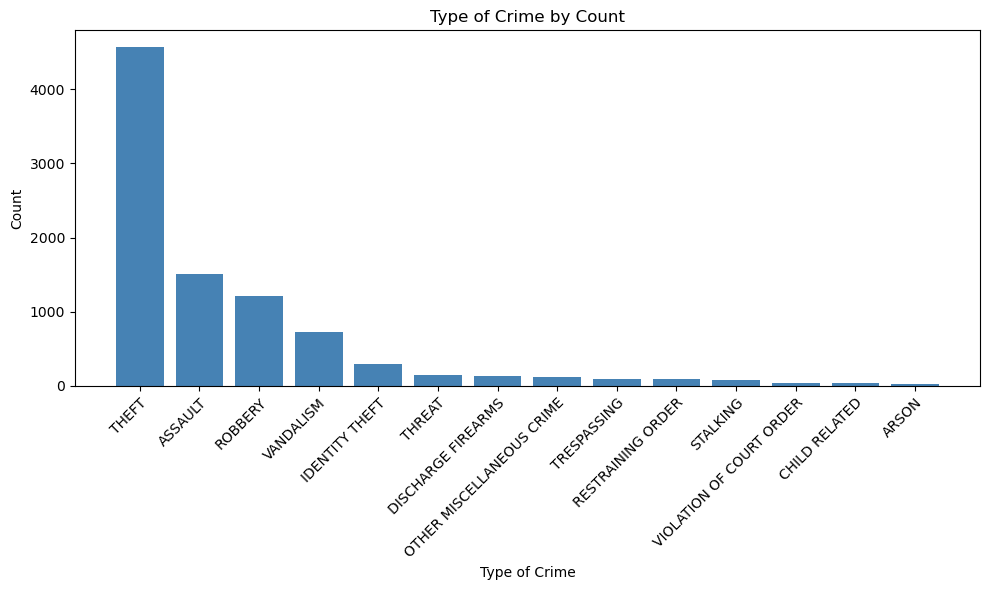

In [4]:
# Extracting the data for plotting
labels = sorted_grouped["Type of Crime"][:14]  
values = sorted_grouped["count"][:14]  

# Creating the bar chart
plt.figure(figsize=(10, 6))
plt.bar(labels, values, color='steelblue')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')  # Rotating x-axis labels for better readability
plt.xlabel('Type of Crime')
plt.ylabel('Count')
plt.title('Type of Crime by Count')
plt.tight_layout()

# Display the plot
plt.show()

# Dusko's Analysis 1
Plotting out the overall number of crimes that occurred per month over the course of 2020 resulted in a somwhat interested and kind of expected result given the external environmental factors happening at the same time.  What we see in the chart is a significant drop in the number of crimes after January which, given the world was in the trows of COVID lockdown commencements at the time could easily be seen as a key contributor to the sharp reduction.  However, additional data and analysis would be required to substantiate this assumption.

### Standard Deviation is σ: 848.903263040024
A measure of the amount of variation or dispersion in a set of data points. A higher standard deviation indicates that the data points are spread out more from the mean (average), while a lower standard deviation suggests that the data points are closer to the mean. 
In this case, the standard deviation is approximately 848.90, which means that the data points are quite spread out from the mean. The mean (average) of the data is approximately 761.58 which was expected as January was so high.


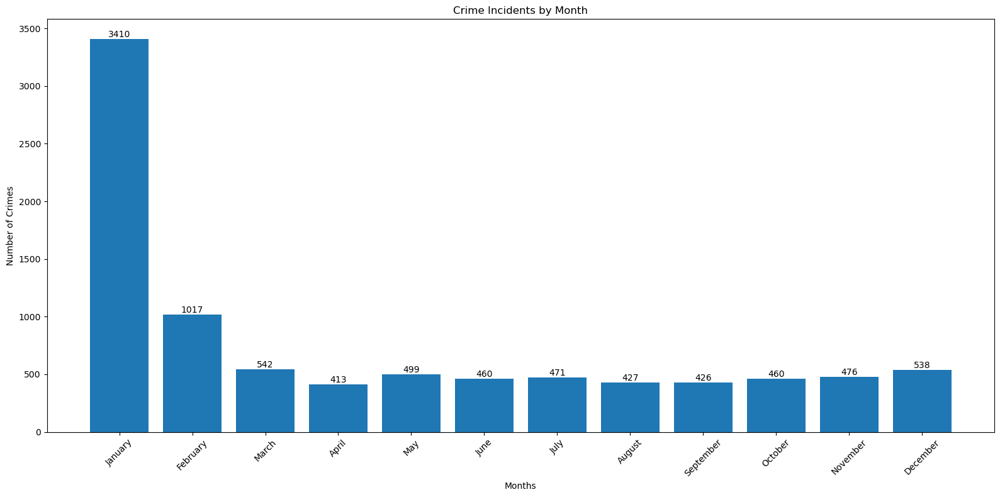

In [5]:
# Convert the "Date Occurred" column to datetime format
crime_data_clean["Date Occurred"] = pd.to_datetime(crime_data_clean["Date Occurred"])

# Extract the month from the "Date Occurred" column
crime_data_clean["month"] = crime_data_clean["Date Occurred"].dt.month

# Group the data by month and get the count of crimes for each month
crime_count_by_month = crime_data_clean["month"].value_counts().sort_index()

# Create a list of month names for labeling the x-axis
month_names = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Plot the bar graph
plt.figure(figsize=(16, 8))
bars = plt.bar(crime_count_by_month.index, crime_count_by_month.values)
plt.xticks(crime_count_by_month.index, month_names, rotation=45)
plt.xlabel("Months")
plt.ylabel("Number of Crimes")
plt.title("Crime Incidents by Month")

# Add text annotations for each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height),
             ha="center", va="bottom")

plt.tight_layout()
plt.show()

In [6]:
# Calculate the standard deviation of crime incidents by month
crime_std_dev = crime_data_clean.groupby("month")["month"].count().std()

# Print the final result
print("Standard Deviation of Crime Incidents by Month:", crime_std_dev)

Standard Deviation of Crime Incidents by Month: 849.6244580383556


# Dusko's Analysis 2
The crime rates are not evenly distributed across Los Angeles. Some areas have significantly higher crime rates than others.

__Crime Hotspots:__  Crime rates can vary widely across different neighbourhoods in Los Angeles. Central, Southwest, Harbor and Ramprt have experienced significantly higher crime rates than most other areas of  greater Los Angeles.

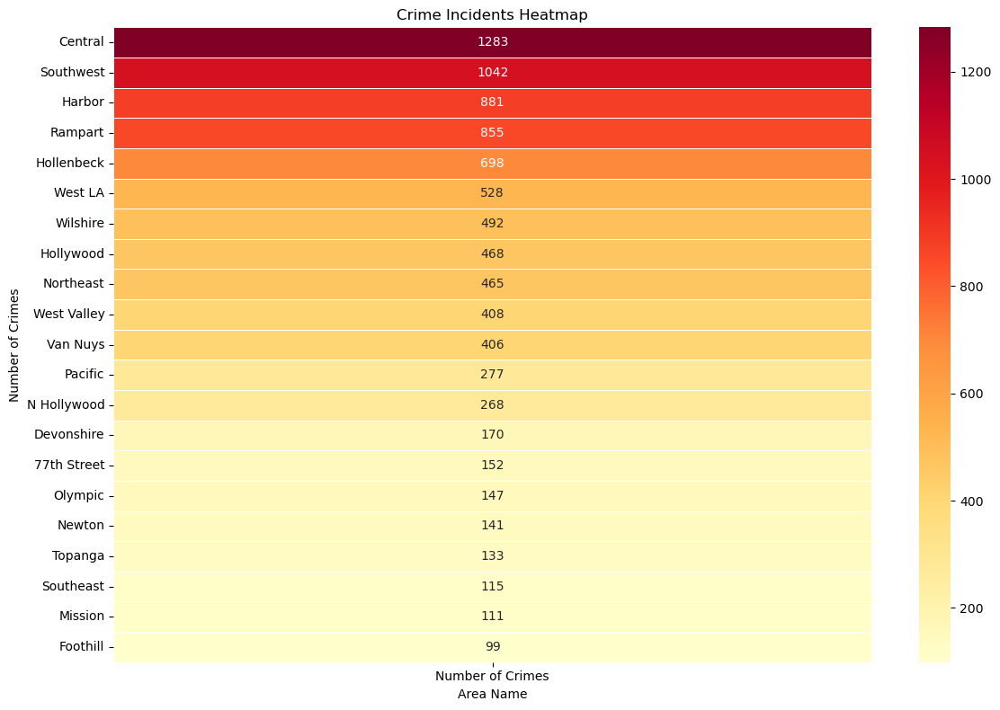

In [7]:
# Group the data by "area_name" and get the total count of crimes for each area
crime_count_by_area = crime_data_clean["Area Name"].value_counts()

# Sort the data by area name in descending order of crime count
crime_count_by_area = crime_count_by_area.sort_values(ascending=False)

# Create a dataframe for heatmap
crime_heatmap_df = pd.DataFrame({"Number of Crimes": crime_count_by_area.values}, index=crime_count_by_area.index)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(crime_heatmap_df, annot=True, fmt="d", cmap="YlOrRd", linewidths=0.5)
plt.xlabel("Area Name")
plt.ylabel("Number of Crimes")
plt.title("Crime Incidents Heatmap")
plt.tight_layout()
plt.show()

# Shayla's Analysis 1
Evidence suggests that in the majority of crimes, there are a higher number of male victims as opposed to female victims. While 'theft' has the highest total of victims by sex.

In [8]:
# Pull data for victim demographic (age and sex)
victim_demographic = crime_data_clean[['Type of Crime', 'Victim Age', 'Victim Gender']]

# Drop data that does not provide specific sex 
drop_value = ['X', 'H']
victim_demographic_updated = victim_demographic[~victim_demographic['Victim Gender'].isin(drop_value)].copy()

# Drop data with NaN for victim age and replace with 0  
victim_demographic_updated.loc['Victim Age'] = victim_demographic_updated['Victim Age'].fillna('0')
victim_demographic_updated.head()

,Type of Crime,Victim Age,Victim Gender
0,ASSAULT,36,F
1,ASSAULT,25,M
3,VANDALISM,76,F
5,ASSAULT,25,F
6,THEFT,23,M


In [9]:
# Display and sort crime type 
crime_count = victim_demographic.groupby("Type of Crime").size().reset_index(name="Count")
sorted_crime_count = crime_count.sort_values(by="Count", ascending=False)
sorted_crime_count

,Type of Crime,Count
20,THEFT,4563
1,ASSAULT,1505
18,ROBBERY,1216
23,VANDALISM,723
13,IDENTITY THEFT,299
21,THREAT,154
9,DISCHARGE FIREARMS,128
16,OTHER MISCELLANEOUS CRIME,124
22,TRESPASSING,95
17,RESTRAINING ORDER,93


In [10]:
# Count male and female 
sex_count = victim_demographic_updated.groupby(["Type of Crime", "Victim Gender"]).size().reset_index(name='Count')
sex_count

# Readability and separating male and female 
sex_count_pivot = sex_count.rename(columns={'F': 'Female', 'M': 'Male'})
sex_count_pivot = sex_count.pivot(index="Type of Crime", columns="Victim Gender", values='Count')
sex_count_pivot = sex_count_pivot.rename_axis(None, axis=1)
sex_count_pivot.reset_index(inplace=True)
# Replace NaN with 0 value 
sex_count_pivot['F'] = sex_count_pivot['F'].fillna(0)
sex_count_pivot['M'] = sex_count_pivot['M'].fillna(0)
sex_count_pivot

,Type of Crime,F,M
0,ARSON,6.0,7.0
1,ASSAULT,780.0,698.0
2,BOMB SCARE,0.0,4.0
3,"BUNCO, ATTEMPT",0.0,3.0
4,CHILD RELATED,27.0,8.0
5,CONTEMPT OF COURT,0.0,2.0
6,CRIMINAL HOMICIDE,0.0,6.0
7,CYBER CRIME,3.0,3.0
8,DISCHARGE FIREARMS,30.0,76.0
9,DISTURBING THE PEACE,4.0,7.0


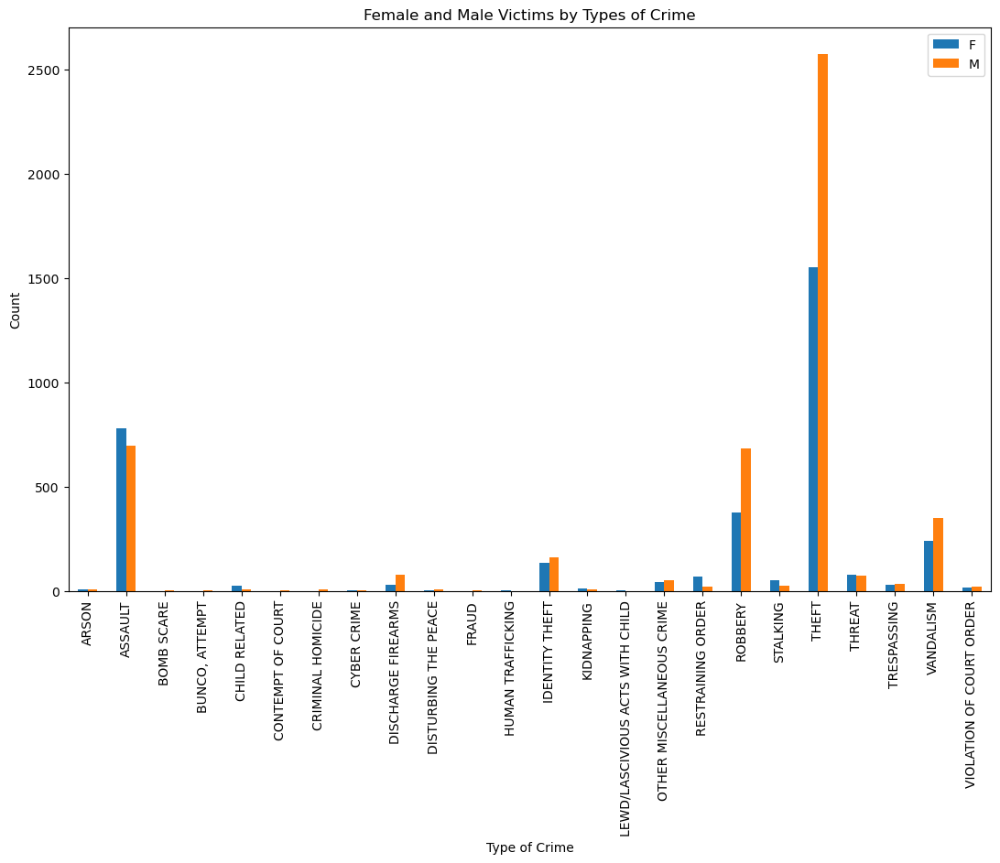

In [11]:
# Plot
victim_gender_crime = sex_count_pivot[['F', 'M']]
victim_gender_crime.plot(kind="bar", figsize=(13, 8))
plt.title("Female and Male Victims by Types of Crime")
plt.xlabel("Type of Crime")
plt.ylabel("Count")
plt.xticks(range(len(sex_count_pivot["Type of Crime"])), sex_count_pivot["Type of Crime"], rotation=90)
plt.show()

Shayla's Analysis 2

In [12]:
# Bins for victim age 
age_bins = [0, 18, 26, 46, 65, 100]
age_labels = ['0-17', '18-25', '26-45', '46-64', '65-100']

victim_demographic_updated['Victim Age'] = victim_demographic_updated['Victim Age'].astype(float)

victim_demographic_updated['Age Group'] = pd.cut(victim_demographic_updated['Victim Age'], bins=age_bins, labels=age_labels, right=False)

vic_demo_count = victim_demographic_updated.groupby(["Type of Crime","Age Group"]).size().reset_index(name="Age Group Count")
vdc_filter = vic_demo_count[vic_demo_count["Age Group Count"] > 70]
vic_demo_count = vdc_filter.sort_values(by=["Age Group Count"], ascending=[False])
vic_demo_count

,Type of Crime,Age Group,Age Group Count
97,THEFT,26-45,2024
98,THEFT,46-64,1126
7,ASSAULT,26-45,648
87,ROBBERY,26-45,514
96,THEFT,18-25,479
8,ASSAULT,46-64,363
99,THEFT,65-100,333
6,ASSAULT,18-25,277
112,VANDALISM,26-45,249
88,ROBBERY,46-64,248


In [13]:
#pivot bins to columns
vic_pivoted = pd.pivot_table(vic_demo_count, index='Type of Crime', columns='Age Group', values='Age Group Count', fill_value=0)
vic_pivoted

Age Group,0-17,18-25,26-45,46-64,65-100
Type of Crime,,,,,
ASSAULT,105,277,648,363,85
IDENTITY THEFT,0,0,147,77,0
ROBBERY,80,143,514,248,76
THEFT,164,479,2024,1126,333
THREAT,0,0,78,0,0
VANDALISM,0,74,249,162,0


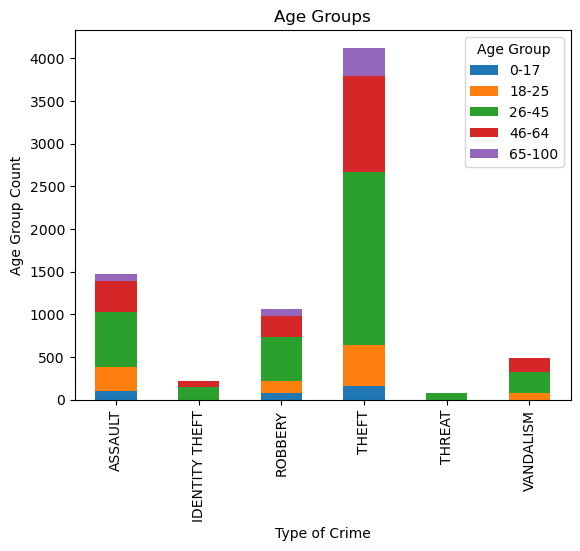

In [14]:
#create the stacked bar chart
vic_pivoted.plot(kind='bar', stacked=True)

# Set the title and axis labels
plt.title('Age Groups')
plt.xlabel('Type of Crime')
plt.ylabel('Age Group Count')
plt.show()

# Julie's Analysis 1
When plotting the average number of days between when a crime occurred and when it was reported by the Type of Crime, there are 3 stand out results; Child Related, Identity Theft and Stalking.  Anecdotally, identity theft and stalking generally happen over a longer period of time so, it is a safe to assume that there would be a greater number of days between when it started and when it is eventually reported.  However, in our efforts to consolidate similar crimes based on our own interpretations, the results should be reviewed and potenially re-cut in relation to child related crimes to get a more accurate result.

In [15]:
#Calculate days between Date Occurred and Date reported and add to DataFrame
days_diff_df = crime_data_clean[["Date reported","Date Occurred","Type of Crime", "Area Name","lat","lon"]].copy()
days = (days_diff_df['Date reported'] - days_diff_df['Date Occurred'])

days_diff_df['Days'] = days
days_diff_df['Days'] = days_diff_df['Days'].dt.days.astype('int16')
days_diff_df.head()

,Date reported,Date Occurred,Type of Crime,Area Name,lat,lon,Days
0,2020-01-08,2020-01-08,ASSAULT,Southwest,34.0141,-118.2978,0
1,2020-01-02,2020-01-01,ASSAULT,Central,34.0459,-118.2545,1
2,2020-04-14,2020-02-13,OTHER MISCELLANEOUS CRIME,Central,34.0448,-118.2474,61
3,2020-01-01,2020-01-01,VANDALISM,N Hollywood,34.1685,-118.4019,0
4,2020-01-01,2020-01-01,VANDALISM,Mission,34.2198,-118.4468,0


In [16]:
#Group dataframe by Type of Crime and average the number of days to report per Type of Crime
crime_grp = days_diff_df.groupby(['Type of Crime'])
avg_days = round(crime_grp['Days'].mean(),1)
count = crime_grp['Type of Crime'].count()
crime_avg_result = pd.DataFrame({'Avg. Days': avg_days, 'count': count})
rslt_df = crime_avg_result[crime_avg_result['count'] >10]
rslt_df

,Avg. Days,count
Type of Crime,,
ARSON,0.8,20
ASSAULT,14.1,1505
CHILD RELATED,157.8,35
DISCHARGE FIREARMS,7.0,128
DISTURBING THE PEACE,2.8,11
IDENTITY THEFT,236.1,299
KIDNAPPING,0.7,17
OTHER MISCELLANEOUS CRIME,41.0,124
RESTRAINING ORDER,0.5,93


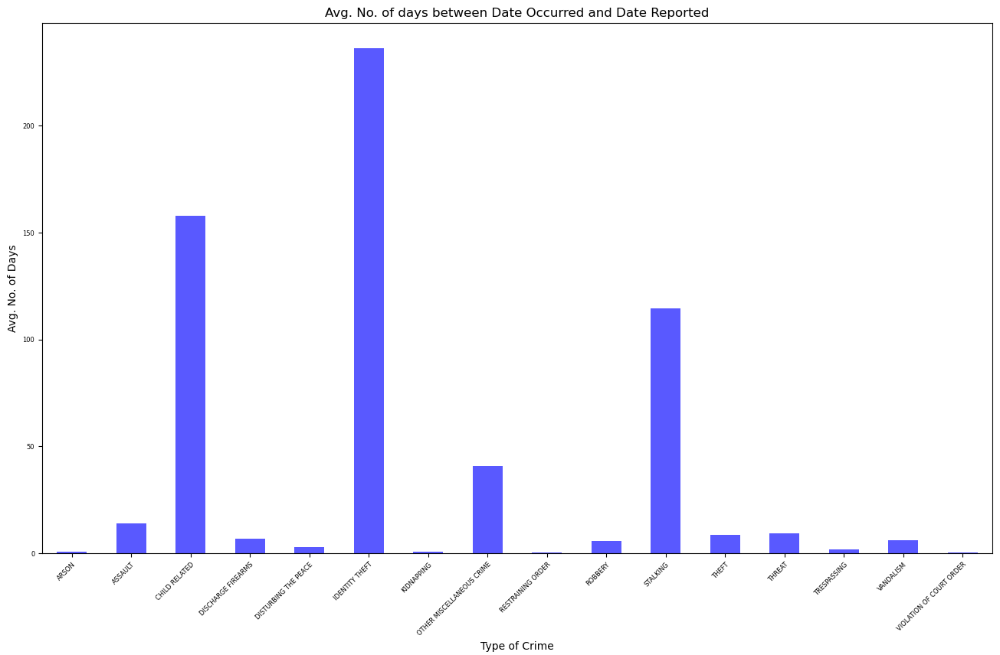

In [17]:
#create bar plot of average days per type of crime
reslt = rslt_df['Avg. Days']
figure1 = reslt.plot(kind='bar', fontsize=6, title='Avg. No. of days between Date Occurred and Date Reported', facecolor='blue', alpha=0.65, figsize=(16,9))
figure1.set_xlabel("Type of Crime")
figure1.set_ylabel("Avg. No. of Days")
xtick_labels = rslt_df.index
figure1.set_xticklabels(xtick_labels, rotation=45, rotation_mode="anchor", ha="right", wrap=True)
plt.show()

# Julie's Analysis 2
Surprisingly, the previously held concerns around the grouping of child related crimes appears to be unfounded as indicated by the box plot results which show a concerntration in the 3rd quartile with only a couple of outliers.

What's more interesting is the number of outliers in relation to stalking indicating a lack of consistency in the number of days and that the outliers can be seen as the primary contributing factor in the elevated average for the group.

What we do see sonsistently in this plot, is the mean which sits quite low in all 3 types of crimes.

In [18]:
#filter list to the top 3 named crimes in terms of average days
filter_list = ["IDENTITY THEFT","CHILD RELATED","STALKING"]
days_data_df = days_diff_df[days_diff_df["Type of Crime"].isin(filter_list)]
days_data_df

,Date reported,Date Occurred,Type of Crime,Area Name,lat,lon,Days
18,2021-11-22,2020-11-19,IDENTITY THEFT,Van Nuys,34.1857,-118.4574,368
20,2020-09-10,2020-09-09,IDENTITY THEFT,Van Nuys,34.2039,-118.4312,1
23,2021-11-18,2020-12-28,IDENTITY THEFT,West Valley,34.1748,-118.5228,325
25,2021-11-29,2020-11-01,IDENTITY THEFT,West Valley,34.1745,-118.5383,393
31,2021-11-24,2020-04-28,IDENTITY THEFT,West LA,34.0507,-118.3762,575
...,...,...,...,...,...,...,...
9909,2020-06-26,2020-06-20,IDENTITY THEFT,Van Nuys,34.1907,-118.4479,6
9933,2020-09-12,2020-09-12,IDENTITY THEFT,West LA,34.0977,-118.4601,0
9935,2022-02-19,2020-08-20,IDENTITY THEFT,Mission,34.2427,-118.4702,548
9953,2021-12-03,2020-12-03,IDENTITY THEFT,Devonshire,34.2268,-118.5697,365


In [19]:
# Create empty list to fill with days data (for plotting)
dd = []

# Calculate the IQR and quantitatively determine if there are any potential outliers. 
for i in filter_list:
    ddata = days_data_df[days_data_df["Type of Crime"]==i]["Days"]
    dd.append(ddata)
    
    # Locate the rows and get the tumor volumes
    quartiles = ddata.quantile([.25,.5,.75])
    lowerq = quartiles[0.25]
    upperq = quartiles[0.75]
    iqr = upperq-lowerq

    # add subset 
    lower_bound = lowerq - (1.5*iqr)
    upper_bound = upperq + (1.5*iqr)
    
    # Determine outliers using upper and lower bounds
    outliers = ddata.loc[(ddata > upper_bound) | (ddata < lower_bound)]
    print(f"The outliers for {i} are {outliers}.")

The outliers for IDENTITY THEFT are Series([], Name: Days, dtype: int16).
The outliers for CHILD RELATED are 4831    819
8360    747
Name: Days, dtype: int16.
The outliers for STALKING are 202     676
601     457
810     357
1474    731
1500    402
1858    683
2030    482
4316    480
4340    564
5748    993
5781    185
6006    731
6685    369
8386    719
8780    442
8883    672
Name: Days, dtype: int16.


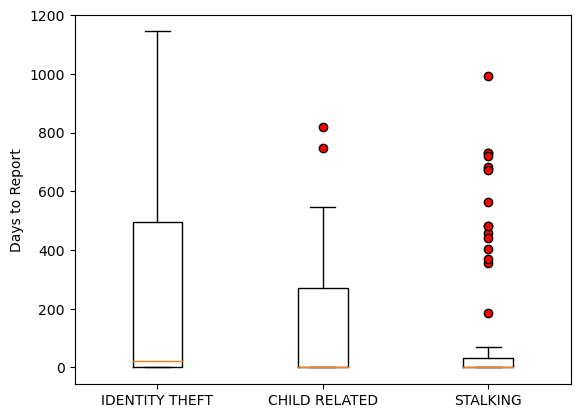

In [20]:
# Generate a box plot that shows the distrubution across quartiles of the Days for each Crime.
plt.boxplot(dd, labels = filter_list,flierprops = dict(marker = "o", markerfacecolor = "red"))
plt.ylabel("Days to Report")
plt.show()